## Resources
- https://musicinformationretrieval.com/
- https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8

In [1]:
!pip show librosa

Name: librosa
Version: 0.10.2.post1
Summary: Python module for audio and music processing
Home-page: https://librosa.org
Author: Brian McFee, librosa development team
Author-email: brian.mcfee@nyu.edu
License: ISC
Location: E:\Anaconda\Lib\site-packages
Requires: audioread, decorator, joblib, lazy-loader, msgpack, numba, numpy, pooch, scikit-learn, scipy, soundfile, soxr, typing-extensions
Required-by: 


In [2]:
import librosa

In [4]:
#!ls 

In [5]:
#!ls -la royalty-free-music

In [8]:
audio_path = 'E:/courses/resume_projects/Audio_processing_python/raw_audio_files/bensound-dubstep.mp3'

In [9]:
music_array, sample_rate = librosa.load(audio_path)

In [10]:
print(type(music_array), type(sample_rate))

<class 'numpy.ndarray'> <class 'int'>


In [11]:
print(music_array.shape, sample_rate)

(2753924,) 22050


### Note:  The above selected  audio time series as a numpy array with a default sampling rate(sr) of 22KHZ mono

In [16]:
music_array2 , sample_rate2 = librosa.load(audio_path, sr=44100) #sample rate is changed 

In [13]:
print(music_array2.shape, sample_rate2)

(5507847,) 44100


In [14]:
music_array3 , sample_rate_none = librosa.load(audio_path, sr=None)

In [17]:
print(music_array3.shape, sample_rate_none)

(5507847,) 44100


## What is Sample Rate:
- The sample rate is the number of samples carried by the selected audio per second, measured either in Hz or kHz

# Playing audio in Jupyter Notebook

In [20]:
import IPython.display as ipd
ipd.Audio(audio_path)

# Audio Signals or Waveform visualization

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

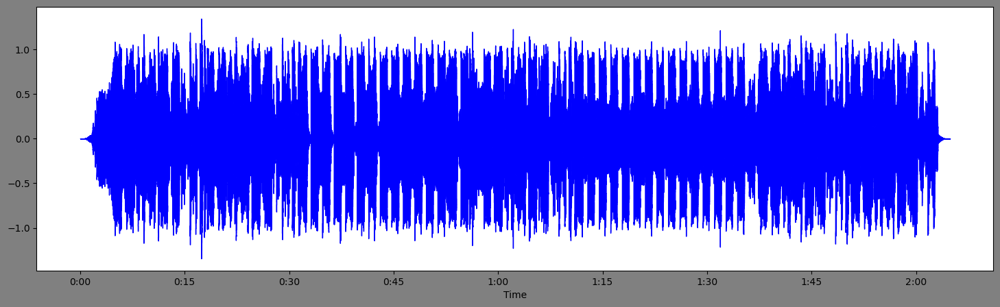

In [24]:
plt.figure(figsize=(18, 5), facecolor=(.5, .5, .5))
librosa.display.waveshow(music_array2, sr=sample_rate2, color='blue')

# Spectrogram Visualization
- A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. 
- Spectrograms are sometimes called sonographs, voiceprints, or voicegrams. 
- When the data is represented in a 3D plot, they may be called waterfalls. 
- In 2-dimensional arrays, the first axis is frequency while the second axis is time.

In [25]:
X = librosa.stft(music_array2)
Xdb = librosa.amplitude_to_db(abs(X))

In [26]:
Xdb

array([[-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
         2.16878988e-02, -1.09747455e-01, -2.57594109e+00],
       [-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
        -5.98630047e+00, -5.90138006e+00, -5.64622974e+00],
       [-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
        -2.72536278e+01, -2.72536278e+01, -1.55829058e+01],
       ...,
       [-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
        -2.72536278e+01, -2.72536278e+01, -2.72536278e+01],
       [-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
        -2.72536278e+01, -2.72536278e+01, -2.72536278e+01],
       [-2.72536278e+01, -2.72536278e+01, -2.72536278e+01, ...,
        -2.72536278e+01, -2.72536278e+01, -2.72536278e+01]], dtype=float32)

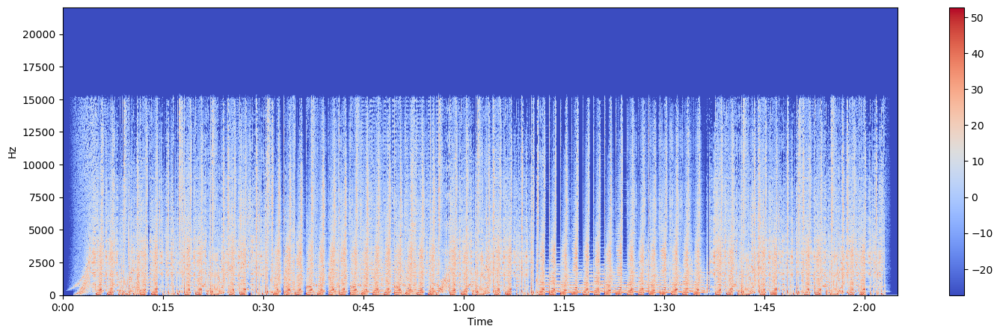

In [28]:
plt.figure(figsize=(18, 5))
librosa.display.specshow(Xdb, sr=sample_rate2, x_axis='time', y_axis='hz')
plt.colorbar()

## The graph 
- The vertical axis shows frequencies (from 0 to 10kHz), and the horizontal axis shows the time of the clip. 
- Since all action is taking place at the bottom of the spectrum, we can convert the frequency axis to a logarithmic one.

In [29]:
print(music_array2.shape, sample_rate2)

(5507847,) 44100


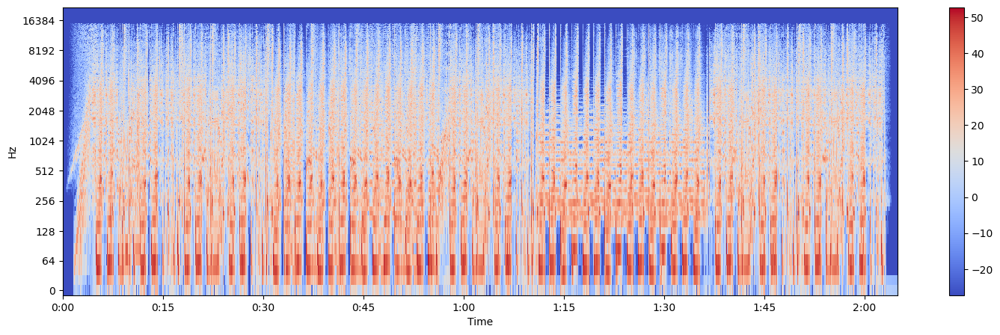

In [31]:
plt.figure(figsize=(18, 5))
librosa.display.specshow(Xdb, sr=sample_rate2, x_axis='time', y_axis='log')
plt.colorbar()

# Run the default beat tracker

In [44]:
tempo, beat_frames = librosa.beat.beat_track(y=music_array2, sr=sample_rate2)
# Ensure tempo is a scalar, not an ndarray
if isinstance(tempo, (int, float)):  # Check if tempo is a scalar
    print('Estimated tempo: {:.2f} beats per minute'.format(tempo))
else:
    print("Unexpected format for tempo:", tempo)

Unexpected format for tempo: [72.78829225]


## Frames:
- Frames here correspond to short windows of the signal (y), each separated by hop_length = 512 samples. 
- librosa uses centered frames, so that the kth frame is centered around sample k * hop_length.

In [33]:
# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sample_rate2)

In [34]:
beat_times.shape

(141,)

In [35]:
beat_times

array([  6.64090703,   7.46521542,   8.30113379,   9.12544218,
         9.94975057,  10.76244898,  11.59836735,  12.43428571,
        13.2585941 ,  14.09451247,  14.89560091,  15.74312925,
        16.56743764,  17.39174603,  18.2276644 ,  19.06358277,
        19.87628118,  20.71219955,  21.53650794,  22.36081633,
        23.19673469,  24.02104308,  24.84535147,  25.68126984,
        26.50557823,  27.32988662,  28.15419501,  28.9785034 ,
        29.80281179,  30.63873016,  31.46303855,  32.29895692,
        33.12326531,  33.95918367,  34.78349206,  35.60780045,
        36.43210884,  37.26802721,  38.08072562,  38.91664399,
        39.74095238,  40.57687075,  41.40117914,  42.22548753,
        43.04979592,  43.88571429,  44.71002268,  45.53433107,
        46.35863946,  47.19455782,  48.01886621,  48.85478458,
        49.67909297,  50.50340136,  51.32770975,  52.16362812,
        52.98793651,  53.8122449 ,  54.63655329,  55.47247166,
        56.29678005,  57.13269841,  57.94539683,  58.78

(-1.0, 1.0)

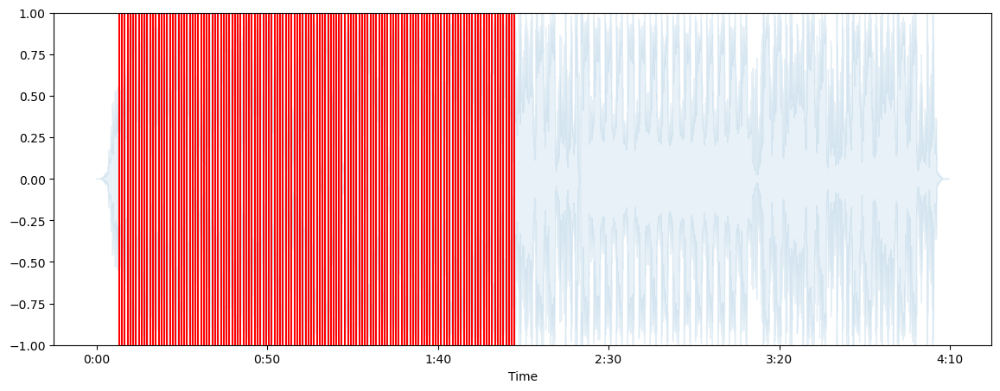

In [36]:
# Got help from here - https://musicinformationretrieval.com/beat_tracking.html
plt.figure(figsize=(14, 5))
librosa.display.waveshow(music_array2, alpha=0.1)
plt.vlines(beat_times, -1, 1, color='r')
plt.ylim(-1, 1)

# Saving to the local disk

In [37]:
import soundfile as sf

In [38]:
sf.write('temp_file_1.wav', music_array2, samplerate=sample_rate2)

In [40]:
sf.write('temp_file_48000.wav', music_array2, 48000, 'PCM_24')

In [42]:
temp_x, temp_sr = sf.read('temp_file_48000.wav')
print(temp_x.shape, temp_sr)
ipd.Audio(temp_x, rate=temp_sr) 

(5507847,) 48000
